### Loading the Data

In [1]:
dataDir='./dataset'

In [2]:
single_image= './dataset/Tomato_Early_blight/00c5c908-fc25-4710-a109-db143da23112___RS_Erly.B 7778.JPG'

In [3]:
from PIL import Image
import matplotlib.pyplot as plt

In [4]:
img = Image.open(single_image)

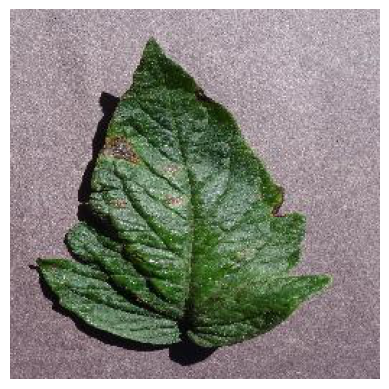

In [5]:
plt.imshow(img)
plt.axis('off')
plt.show()

In [6]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

plt.style.use('ggplot')

C:\Users\KIIT\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [7]:
selectedClasses = ['Tomato_Early_blight',
                   'Tomato_healthy',
                   'Tomato_Late_blight',
                   'Tomato_Septoria_leaf_spot',
                 'Potato___Early_blight','Potato___healthy','Potato___Late_blight']

In [8]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)

# Convert the 2 lists to dataframe to easy use
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,./dataset\Tomato_Septoria_leaf_spot\fe20769d-b...,Tomato_Septoria_leaf_spot
1,./dataset\Potato___Late_blight\073a7489-b8dd-4...,Potato___Late_blight
2,./dataset\Potato___Early_blight\93c3dfcc-de7c-...,Potato___Early_blight
3,./dataset\Tomato_Early_blight\2312305e-c167-47...,Tomato_Early_blight
4,./dataset\Tomato_Late_blight\5d987d94-661d-42e...,Tomato_Late_blight
...,...,...
8418,./dataset\Tomato_healthy\e12936ac-7354-434c-b8...,Tomato_healthy
8419,./dataset\Potato___Late_blight\3a0033d6-2efc-4...,Potato___Late_blight
8420,./dataset\Tomato_Septoria_leaf_spot\abd969f8-a...,Tomato_Septoria_leaf_spot
8421,./dataset\Tomato_Early_blight\070679a9-27e1-4e...,Tomato_Early_blight


### Data Explorations

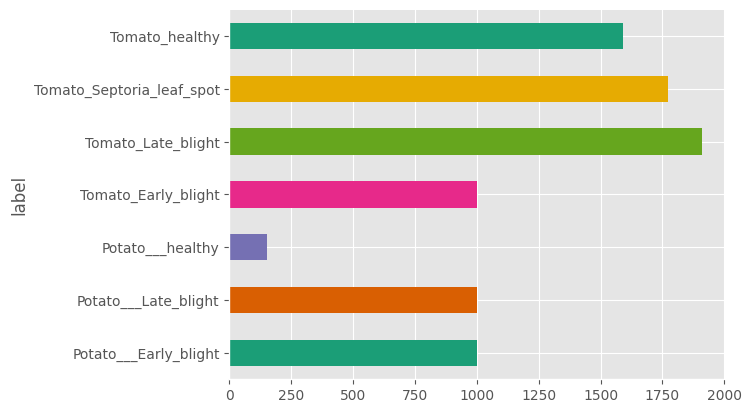

In [9]:
# title label

from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('label').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

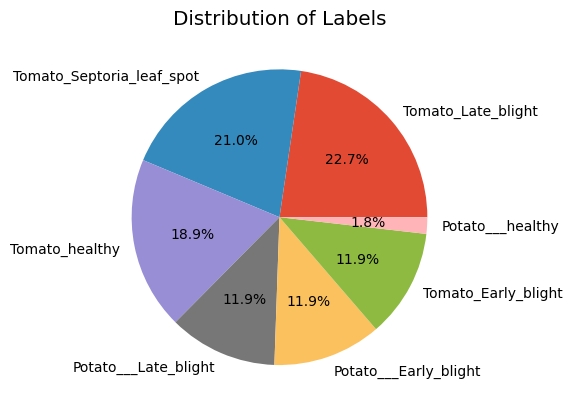

In [10]:
# title Distribution of Labels

import matplotlib.pyplot as plt

df['label'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')
_ = plt.title('Distribution of Labels')

In [11]:
len(df)

8423

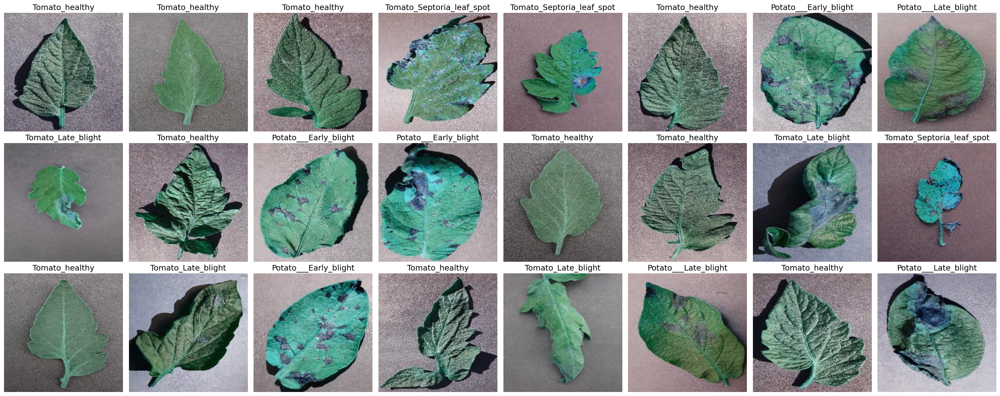

In [12]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

### Image Preprocessing

In [13]:
df['label'] = df['label'].replace({'Tomato_healthy':0 ,
                                   'Tomato_Septoria_leaf_spot':1 ,
                                   'Tomato_Early_blight':2 ,
                                   'Tomato_Late_blight':3,'Potato___Early_blight':4
        ,'Potato___healthy':5,'Potato___Late_blight':6}).astype(int)

C:\Users\KIIT\AppData\Local\Temp\ipykernel_19924\3152607200.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Tomato_healthy':0 ,


In [14]:
IMG_SIZE = (150, 150)  # Resize to save resources and reduce execution time
imgs = []

for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    
    # Check if the image was successfully loaded
    if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, IMG_SIZE)
        imgs.append(img)
    else:
        print(f"Warning: Image not found or cannot be loaded at {imgPath}")

100%|██████████| 8423/8423 [00:25<00:00, 330.06it/s]


In [15]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(8423, 8423)

In [16]:
images = images / 255.0

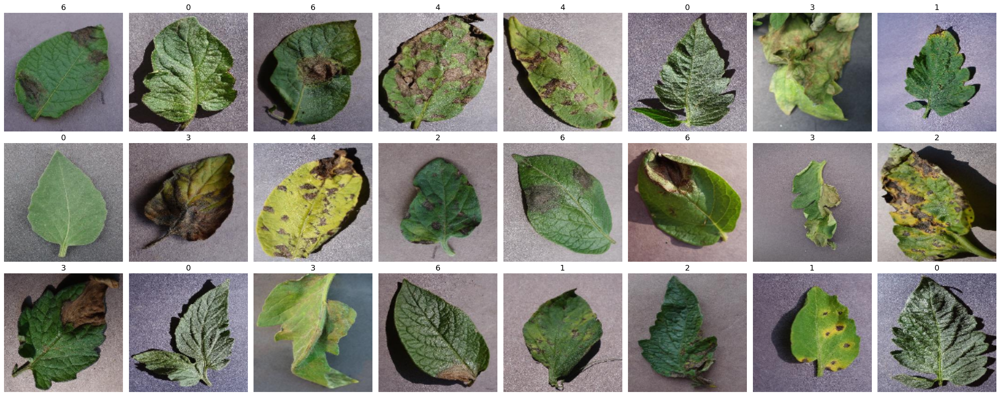

In [17]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

### Splitting

In [18]:


X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (6738, 150, 150, 3)
Shape of X_test : (1685, 150, 150, 3)
Shape of y_train : (6738,)
Shape of y_test : (1685,)


In [19]:
print(y_train[:5]) 

[1 3 3 4 2]


### CNN Model

In [21]:
'''import pickle
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10  # Example dataset for training
from tensorflow.keras.utils import to_categorical

# Load and preprocess the data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Resize to match input shape and normalize
X_train = X_train / 255.0
X_test = X_test / 255.0
y_train = y_train.flatten()  # Ensure labels are 1D
y_test = y_test.flatten()

# Filtering to match the 7-class problem (example: restrict classes 0 to 6)
valid_classes = {0, 1, 2, 3, 4, 5, 6}
train_filter = [i for i, label in enumerate(y_train) if label in valid_classes]
test_filter = [i for i, label in enumerate(y_test) if label in valid_classes]
X_train, y_train = X_train[train_filter], y_train[train_filter]
X_test, y_test = X_test[test_filter], y_test[test_filter]

# Defining the CNN model
kerasModel = Sequential([
    Input(shape=(32, 32, 3)),  # Adjust to 32x32 for CIFAR-10
    
    # Convolutional Block 1
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),
    
    # Convolutional Block 2
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.3),
    
    # Convolutional Block 3
    Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.4),

    # Flattening the feature maps
    Flatten(),
    
    # Fully Connected Layers
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(7, activation='softmax')  # Output layer with 7 classes (for classification)
])

# Compiling the model
kerasModel.compile(
    optimizer=Adam(learning_rate=0.001),  # Optimizer with a suitable learning rate
    loss='sparse_categorical_crossentropy',  # Sparse for integer labels
    metrics=['accuracy']
)

# Training the model
history = kerasModel.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=10,
    batch_size=64,
    verbose=1
)

# Evaluate the model
test_loss, test_accuracy = kerasModel.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Save the model as a pickle file
model_file = "cnnmodel.pkl"
with open(model_file, 'wb') as file:
    pickle.dump(kerasModel, file)

print(f"Model saved to {model_file}")

# To use this model for predictions later:
# Load the model
with open(model_file, 'rb') as file:
    loaded_model = pickle.load(file)

# Example prediction
sample_image = X_test[0:1]  # Single image
prediction = loaded_model.predict(sample_image)
print(f"Prediction: {prediction}")
'''

Epoch 1/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - accuracy: 0.3837 - loss: 1.9215 - val_accuracy: 0.1793 - val_loss: 5.1222
Epoch 2/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 52s 118ms/step - accuracy: 0.5310 - loss: 1.2263 - val_accuracy: 0.3986 - val_loss: 1.9802
Epoch 3/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 49s 112ms/step - accuracy: 0.5859 - loss: 1.0927 - val_accuracy: 0.6200 - val_loss: 1.0090
Epoch 4/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 51s 117ms/step - accuracy: 0.6211 - loss: 1.0052 - val_accuracy: 0.6189 - val_loss: 1.0377
Epoch 5/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - accuracy: 0.6469 - loss: 0.9386 - val_accuracy: 0.6549 - val_loss: 0.9768
Epoch 6/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 65s 148ms/step - accuracy: 0.6726 - loss: 0.8717 - val_accuracy: 0.7204 - val_loss: 0.7799
Epoch 7/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - accuracy: 0.6894 - loss: 0.8380 - val_accuracy: 0.6299 - val_loss: 1.0271
Epoch 8/10
438/438 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - accuracy: 0.7050 - loss: 0

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam

# Defining the CNN model
kerasModel = Sequential([
    Input(shape=(150, 150, 3)),  # Input layer with the shape of resized images
    
    # Convolutional Block 1
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),
    
    # Convolutional Block 2
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.3),
    
    # Convolutional Block 3
    Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.4),

    # Flattening the feature maps
    Flatten(),
    
    # Fully Connected Layers
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(7, activation='softmax')  # Output layer with 7 classes (for classification)
])

# Compiling the model
kerasModel.compile(
    optimizer=Adam(learning_rate=0.001),  # Optimizer with a suitable learning rate
    loss='sparse_categorical_crossentropy',  # Sparse for integer labels
    metrics=['accuracy']
)

# Summary of the model
kerasModel.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    10,617,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,713,031 (40.87 MB)

 Trainable params: 10,712,583 (40.87 MB)

 Non-trainable params: 448 (1.75 KB)

In [21]:
kerasModel.compile(optimizer='adam',loss='categorical_crossentropy' ,metrics=['accuracy'])

In [22]:
from tensorflow.keras.utils import to_categorical

y_train_one_hot = to_categorical(y_train, num_classes=7)
y_test_one_hot = to_categorical(y_test, num_classes=7)

In [23]:
kerasModel.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [24]:
history = kerasModel.fit(
    X_train, y_train_one_hot,
    validation_split=0.2,
    epochs=50,
    batch_size=50,
    verbose=1,
    callbacks=[tf.keras.callbacks.EarlyStopping(
        patience=5,
        monitor='val_accuracy',
        restore_best_weights=True
    )]
)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 102s 884ms/step - accuracy: 0.5466 - loss: 2.4483 - val_accuracy: 0.2010 - val_loss: 14.0212
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 93s 863ms/step - accuracy: 0.7045 - loss: 0.8914 - val_accuracy: 0.2010 - val_loss: 35.9279
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 98s 908ms/step - accuracy: 0.7448 - loss: 0.7175 - val_accuracy: 0.2404 - val_loss: 20.1946
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 97s 901ms/step - accuracy: 0.7886 - loss: 0.6389 - val_accuracy: 0.4110 - val_loss: 4.3542
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 98s 903ms/step - accuracy: 0.8112 - loss: 0.5428 - val_accuracy: 0.3064 - val_loss: 18.0264
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 97s 903ms/step - accuracy: 0.8071 - loss: 0.5610 - val_accuracy: 0.6847 - val_loss: 1.5427
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 99s 918ms/step - accuracy: 0.8373 - loss: 0.4861 - val_accuracy: 0.7448 - val_loss: 1.1060
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 98s 907ms/step - accuracy: 0.8461 - lo

In [25]:
y_pred = kerasModel.predict(X_test)

53/53 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step


### Evaluation of CNN Model

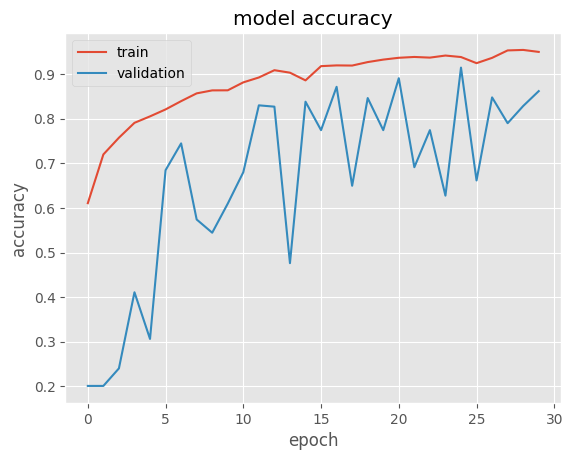

In [26]:
#### showing the Model Accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [27]:
y_test[:10]

array([3, 3, 0, 2, 3, 6, 4, 1, 0, 4])

In [28]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[3, 3, 0, 2, 3, 6, 4, 1, 0, 4]

In [31]:
#import pickle

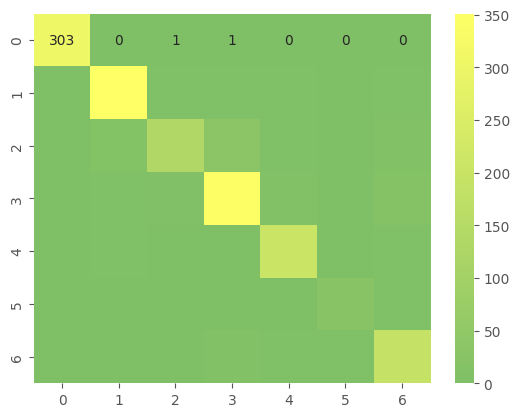

In [29]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [30]:
## Classification report providing the detailed metrics on the result of CNN Model.
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       305
           1       0.95      0.97      0.96       363
           2       0.94      0.70      0.80       195
           3       0.88      0.91      0.90       379
           4       0.92      0.98      0.95       210
           5       0.90      0.87      0.88        30
           6       0.85      0.94      0.89       203

    accuracy                           0.92      1685
   macro avg       0.92      0.91      0.91      1685
weighted avg       0.93      0.92      0.92      1685



### Predicted Images

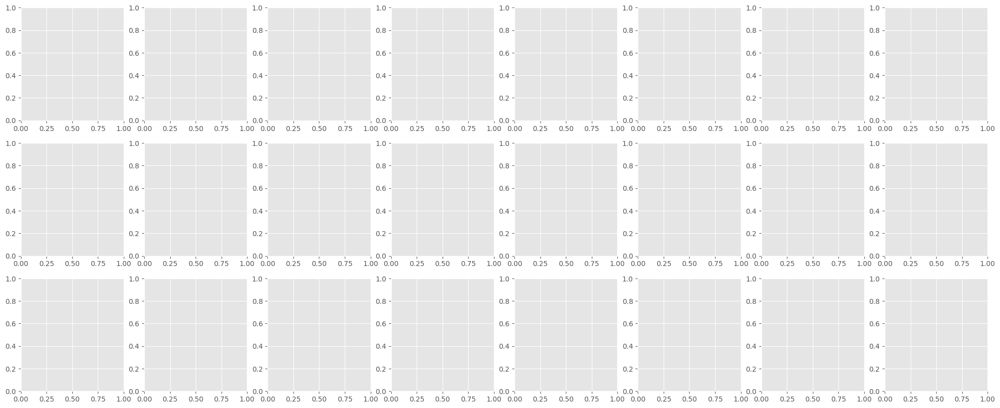

In [31]:
import random
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))  # Randomly select an index
    img = X_test[index]
    label = y_test[index]
    
    # Resize the image to match the model's input size
    resized_img = tf.image.resize(img, (150, 150))  # Resize to 150x150
    
    # Expand dimensions for model input
    reshaped_img = np.expand_dims(resized_img, axis=0)  # Shape: (1, 150, 150, 3)
    
    # Predict the label
    pred = np.argmax


### InceptionV3

In [55]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import seaborn as sns
import matplotlib.pyplot as plt

# Load the InceptionV3 model (without the top layer)
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False  # Freeze the base model to retain pre-trained weights

# Add custom layers on top of InceptionV3
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global pooling instead of flattening
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(7, activation='softmax')(x)  # 7 output classes

# Define the model
inception_model = Model(inputs=base_model.input, outputs=output)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 14s 0us/step


In [56]:
# Compile the model
inception_model.compile(
    optimizer=Adam(learning_rate=0.0001),  # Fine-tuning learning rate
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [57]:
# Summary of the InceptionV3 model
inception_model.summary()

Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 74, 74,    │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 74, 74,    │         96 │ conv2d_7[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 74, 74,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 72, 72,    │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │         96 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 72, 72,    │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 72, 72,    │        192 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 72, 72,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 35, 35,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 35, 35,    │      5,120 │ max_pooling2d_3[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 35, 35,    │        240 │ conv2d_10[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 35, 35,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 33, 33,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 33, 33,    │        576 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 33, 33,    │          0 │ batch_normalizat

 Total params: 22,329,127 (85.18 MB)

 Trainable params: 526,343 (2.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [58]:
# Train the model
history_inception = inception_model.fit(
    X_train, y_train_one_hot,  # Use one-hot encoded labels
    validation_split=0.2,
    epochs=30,
    batch_size=50,
    verbose=1,
    callbacks=[
        EarlyStopping(
            patience=5,
            monitor='val_accuracy',
            restore_best_weights=True
        )
    ]
)

Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - accuracy: 0.3556 - loss: 1.9213 - val_accuracy: 0.7114 - val_loss: 0.8601
Epoch 2/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.6562 - loss: 0.9578 - val_accuracy: 0.7685 - val_loss: 0.6912
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 109s 1s/step - accuracy: 0.7449 - loss: 0.7327 - val_accuracy: 0.8116 - val_loss: 0.5940
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.7763 - loss: 0.6187 - val_accuracy: 0.8220 - val_loss: 0.5403
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.8059 - loss: 0.5594 - val_accuracy: 0.8323 - val_loss: 0.4984
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 114s 1s/step - accuracy: 0.8186 - loss: 0.5088 - val_accuracy: 0.8323 - val_loss: 0.4873
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.8398 - loss: 0.4637 - val_accuracy: 0.8442 - val_loss: 0.4508
Epoch 8/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.8531 - loss: 0.4151 - val_accu

In [60]:
# Evaluate the InceptionV3 model
y_pred_inception = inception_model.predict(X_test)

53/53 ━━━━━━━━━━━━━━━━━━━━ 38s 715ms/step


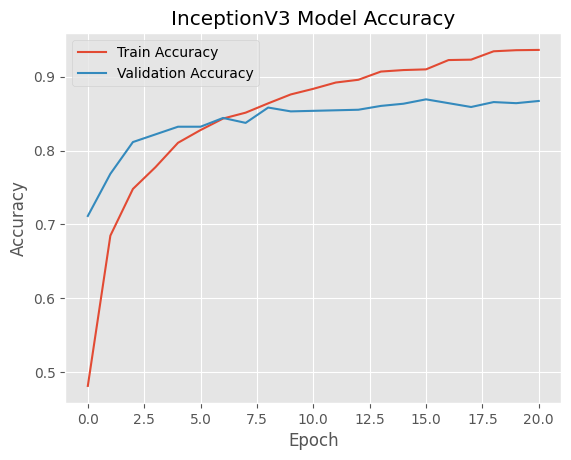

In [61]:
# Plot accuracy
plt.plot(history_inception.history['accuracy'], label='Train Accuracy')
plt.plot(history_inception.history['val_accuracy'], label='Validation Accuracy')
plt.title('InceptionV3 Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [62]:
# Classification report
new_y_pred_inception = [np.argmax(x) for x in y_pred_inception]
classification_report_inception = classification_report(y_test, new_y_pred_inception)
print("Classification Report:\n", classification_report_inception)

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.99      0.95       305
           1       0.85      0.88      0.87       363
           2       0.78      0.69      0.73       195
           3       0.87      0.83      0.85       379
           4       0.90      0.90      0.90       210
           5       0.86      0.80      0.83        30
           6       0.83      0.85      0.84       203

    accuracy                           0.86      1685
   macro avg       0.86      0.85      0.85      1685
weighted avg       0.86      0.86      0.86      1685



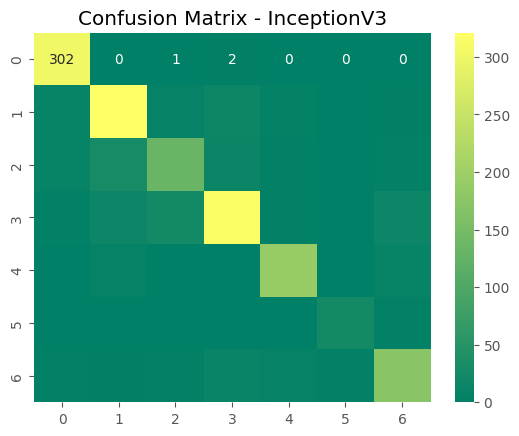

In [63]:
# Confusion Matrix
CM_inception = confusion_matrix(y_test, new_y_pred_inception)
sns.heatmap(CM_inception, annot=True, fmt='d', cmap='summer')
plt.title("Confusion Matrix - InceptionV3")
plt.show()

### MobileNetV2

In [47]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np

# Load the MobileNetV2 model (without the top layer)
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False  # Freeze the base model to retain pre-trained weights

# Adding custom layers on top of MobileNetV2
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global pooling instead of flattening
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(7, activation='softmax')(x)  # 7 output classes

# Define the model
mobilenetv2_model = Model(inputs=base_model.input, outputs=output)

C:\Users\KIIT\AppData\Local\Temp\ipykernel_19924\2193717919.py:12: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


In [48]:
# Compile the model
mobilenetv2_model.compile(
    optimizer=Adam(learning_rate=0.0001),  # Fine-tuning learning rate
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [49]:
# Model Summary
mobilenetv2_model.summary()

Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,587,719 (9.87 MB)

 Trainable params: 329,735 (1.26 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [50]:
# Train the model
history_mobilenetv2 = mobilenetv2_model.fit(
    X_train, y_train_one_hot,  # Use one-hot encoded labels
    validation_split=0.2,
    epochs=50,
    batch_size=50,
    verbose=1,
    callbacks=[
        EarlyStopping(
            patience=5,
            monitor='val_accuracy',
            restore_best_weights=True
        )
    ]
)

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - accuracy: 0.3490 - loss: 1.9246 - val_accuracy: 0.8027 - val_loss: 0.6500
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 138s 1s/step - accuracy: 0.7185 - loss: 0.7914 - val_accuracy: 0.8442 - val_loss: 0.4670
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.7958 - loss: 0.5808 - val_accuracy: 0.8657 - val_loss: 0.3999
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - accuracy: 0.8332 - loss: 0.4804 - val_accuracy: 0.8843 - val_loss: 0.3469
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - accuracy: 0.8486 - loss: 0.4409 - val_accuracy: 0.8932 - val_loss: 0.3255
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.8593 - loss: 0.3897 - val_accuracy: 0.8969 - val_loss: 0.3034
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.8774 - loss: 0.3487 - val_accuracy: 0.8999 - val_loss: 0.2866
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.8898 - loss: 0.3235 - val_accu

In [51]:
# Evaluate the model
y_pred_mobilenetv2 = mobilenetv2_model.predict(X_test)

53/53 ━━━━━━━━━━━━━━━━━━━━ 50s 898ms/step


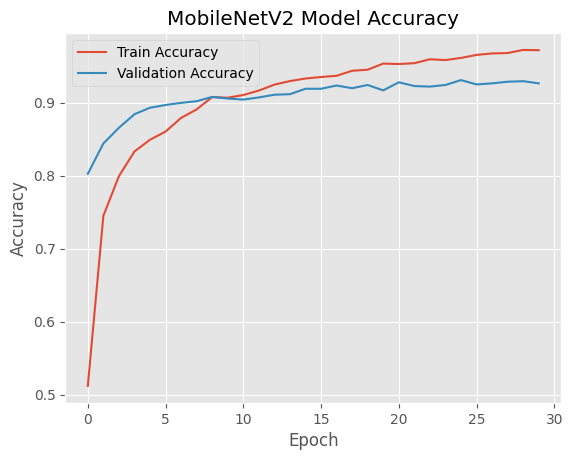

In [52]:
# Plot accuracy
plt.plot(history_mobilenetv2.history['accuracy'], label='Train Accuracy')
plt.plot(history_mobilenetv2.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2 Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [53]:
# Classification metrics
new_y_pred_mobilenetv2 = [np.argmax(x) for x in y_pred_mobilenetv2]
classification_report_mobilenetv2 = classification_report(y_test, new_y_pred_mobilenetv2)
print("Classification Report:\n", classification_report_mobilenetv2)

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       305
           1       0.93      0.95      0.94       363
           2       0.88      0.76      0.82       195
           3       0.90      0.92      0.91       379
           4       0.98      0.99      0.98       210
           5       0.96      0.90      0.93        30
           6       0.91      0.94      0.92       203

    accuracy                           0.93      1685
   macro avg       0.94      0.92      0.93      1685
weighted avg       0.93      0.93      0.93      1685



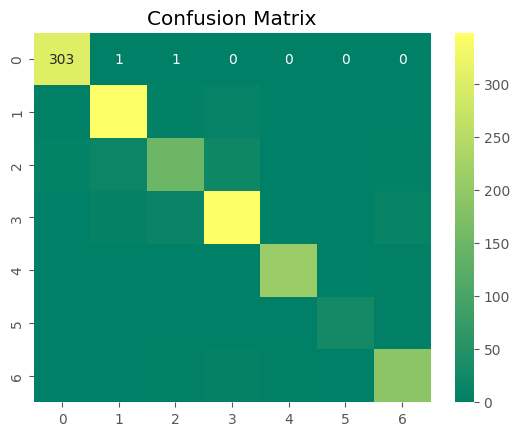

In [54]:
# Confusion Matrix
CM_mobilenetv2 = confusion_matrix(y_test, new_y_pred_mobilenetv2)
sns.heatmap(CM_mobilenetv2, annot=True, fmt='d', cmap='summer')
plt.title("Confusion Matrix")
plt.show()

### Xception

In [32]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Load the Xception model (without the top layer)
base_model = Xception(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False  # Freeze the base model to retain pre-trained weights

# Adding custom layers on top of Xception
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global pooling instead of flattening
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(7, activation='softmax')(x)  # 7 output classes
# Define the model
xception_model = Model(inputs=base_model.input, outputs=output)

# Compile the model
xception_model.compile(
    optimizer=Adam(learning_rate=0.0001),  # Fine-tuning learning rate
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [33]:
xception_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 74, 74,    │        864 │ input_layer_1[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 74, 74,    │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 74, 74,    │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 72, 72,    │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 72, 72,    │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 72, 72,    │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 72, 72,    │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 72, 72,    │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 72, 72,    │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 72, 72,    │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 72, 72,    │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 36, 36,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 36, 36,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 36, 36,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 36, 36,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 36, 36,    │          0 │ add[0][0]       

 Total params: 21,387,823 (81.59 MB)

 Trainable params: 526,343 (2.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [34]:
# Training the model
history_xception = xception_model.fit(
    X_train, y_train_one_hot,  # Use one-hot encoded labels
    validation_split=0.2,
    epochs=50,
    batch_size=50,
    verbose=1,
    callbacks=[
        EarlyStopping(
            patience=5,
            monitor='val_accuracy',
            restore_best_weights=True
        )
    ]
)

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 213s 2s/step - accuracy: 0.3916 - loss: 1.6502 - val_accuracy: 0.7322 - val_loss: 0.8388
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 209s 2s/step - accuracy: 0.7006 - loss: 0.8734 - val_accuracy: 0.8131 - val_loss: 0.6153
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 198s 2s/step - accuracy: 0.7826 - loss: 0.6654 - val_accuracy: 0.8368 - val_loss: 0.5227
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 237s 2s/step - accuracy: 0.8148 - loss: 0.5696 - val_accuracy: 0.8494 - val_loss: 0.4681
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 278s 3s/step - accuracy: 0.8314 - loss: 0.5144 - val_accuracy: 0.8642 - val_loss: 0.4259
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 282s 3s/step - accuracy: 0.8473 - loss: 0.4586 - val_accuracy: 0.8680 - val_loss: 0.4027
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 256s 2s/step - accuracy: 0.8615 - loss: 0.4099 - val_accuracy: 0.8776 - val_loss: 0.3774
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 257s 2s/step - accuracy: 0.8669 - loss: 0.3972 - val_accu

In [35]:
# Evaluate the model
y_pred_xception = xception_model.predict(X_test)

53/53 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step


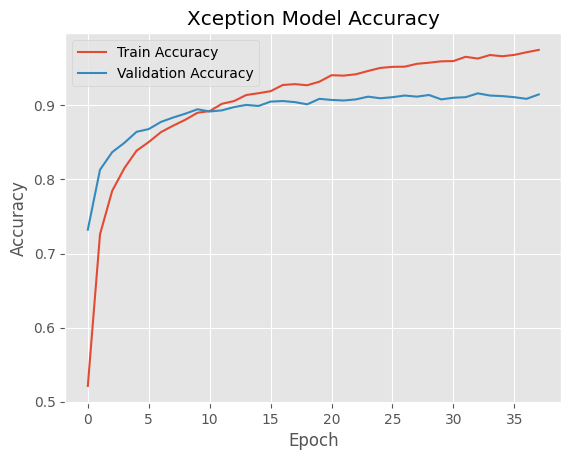

In [36]:
# Plot accuracy
plt.plot(history_xception.history['accuracy'], label='Train Accuracy')
plt.plot(history_xception.history['val_accuracy'], label='Validation Accuracy')
plt.title('Xception Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [37]:
# Classification metrics
new_y_pred_xception = [np.argmax(x) for x in y_pred_xception]
classification_report_xception = classification_report(y_test, new_y_pred_xception)
print("Classification Report:\n", classification_report_xception)

Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98       305
           1       0.92      0.92      0.92       363
           2       0.80      0.82      0.81       195
           3       0.91      0.86      0.88       379
           4       0.98      0.94      0.96       210
           5       0.96      0.87      0.91        30
           6       0.89      0.95      0.92       203

    accuracy                           0.92      1685
   macro avg       0.92      0.91      0.91      1685
weighted avg       0.92      0.92      0.92      1685



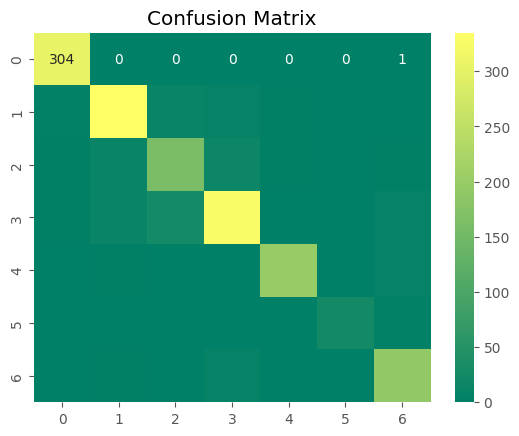

In [40]:
# Confusion Matrix
CM_xception = confusion_matrix(y_test, new_y_pred_xception)
sns.heatmap(CM_xception, annot=True, fmt='d', cmap='summer')
plt.title("Confusion Matrix")
plt.show()

In [42]:
from tensorflow.keras.models import load_model
model = load_model('cnn_model.h5')  # if you had saved it previously

In [43]:
kerasModel.save('cnn_model.h5')
print("CNN model has been saved as cnn_model.h5")

CNN model has been saved as cnn_model.h5


In [44]:
# Save the trained model
model.save('cnn_model.h5')  # Make sure 'model' is the correct variable name
print("CNN model has been saved as cnn_model.h5")

CNN model has been saved as cnn_model.h5


In [45]:
# Save the trained model to an H5 file
model.save("xception_model.h5")

In [46]:
# Load the model back from the H5 file
loaded_model = load_model("xception_model.h5")

# Check the architecture
loaded_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 18, 18, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    10,617,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,713,033 (40.87 MB)

 Trainable params: 10,712,583 (40.87 MB)

 Non-trainable params: 448 (1.75 KB)

 Optimizer params: 2 (12.00 B)